# What's new on non-SNP — SNP-vs-class mirror Manhattans (isotonic WZA)

A **class-specific ("new") peak** for an (axis, model) = a clq0.9/mcf90 block
WZA-significant in the non-SNP class but **not** in the co-located SNP block (same
block id; SNP & non-SNP share the mcf90 partition). First-pass "new": does NOT yet
rule out LD-tagging of a SNP-visible locus (needs the SNP-untagged-subset step).
Built on **isotonic** WZA. Every axis figure shows all 3 models.

In [1]:
import os, sys
import numpy as np, pandas as pd, matplotlib.pyplot as plt
sys.path.insert(0, "/global/scratch/users/tbellg/kmate/analysis/grenenet_selection")
import lib
GEA = "/global/scratch/users/tbellg/kmate/analysis/grenenet_selection"
WD = f"{GEA}/r2_gea_nonsnp/phase1_replication/results/multiaxis/wza"
OUTDIR = f"{GEA}/r2_gea_nonsnp/phase1_replication/results/multiaxis"
AXES = [f"bio{i}" for i in range(1, 20)] + ["pc1"]
MODELS = ["kendall", "lfmm", "binomial"]
CHROM_LEN = {"Chr1":30427671,"Chr2":19698289,"Chr3":23459830,"Chr4":18585056,"Chr5":26975502}
CH = list(CHROM_LEN); OFF = {}; _a = 0
for _c in CH: OFF[_c] = _a; _a += CHROM_LEN[_c]
plt.rcParams.update({"figure.dpi":110})

def bh(p):
    p=np.asarray(p,float); n=len(p)
    if n==0: return p
    o=np.argsort(p); q=np.empty(n); q[o]=(p[o]*n)/(np.arange(n)+1)
    q[o]=np.minimum.accumulate(q[o][::-1])[::-1]; return np.clip(q,0,1)

def load_wza(model, cls, axis):
    f=f"{WD}/wza_{model}_{cls}_gen9_{axis}_isotonic.csv"
    if not os.path.exists(f): return None
    w=pd.read_csv(f).rename(columns={"index":"block"})
    w["block"]=w["block"].astype(str)
    w=w[w["Z_pVal"].notna() & (w["Z_pVal"]>0)].copy()
    w["gpos"]=w["chrom"].map(OFF)+w["pos"]; w["mlp"]=-np.log10(w["Z_pVal"])
    w["q"]=bh(w["Z_pVal"].to_numpy())
    return w

def sig_sets(w):
    n=len(w); bonf=0.05/n
    return dict(bonf=set(w.loc[w["Z_pVal"]<bonf,"block"]), bonf_line=-np.log10(bonf),
                fdr=set(w.loc[w["q"]<0.05,"block"]))

def block_spans(r2=0.9):
    tag=f"clq{r2}"; rows=[]
    for ci in range(1,6):
        g=pd.read_csv(f"{lib.CLQ_BLOCKS_DIR}/chr{ci}_{tag}_blocks_{tag}.tsv",sep="\t").sort_values("start_pos").reset_index(drop=True)
        for idx,r in g.iterrows():
            rows.append((f"Chr{ci}_{idx}",f"Chr{ci}",int(r.start_pos),int(r.end_pos)))
    return pd.DataFrame(rows,columns=["block","chrom","start","end"]).set_index("block")
SPANS=block_spans(); GENES=lib.load_genes()
def genes_on(block):
    if block not in SPANS.index: return []
    s=SPANS.loc[block]; gc=GENES[(GENES.chrom==s.chrom)&(GENES.end>=s.start)&(GENES.start<=s.end)]
    return list(gc.gene)
print("loaded:", len(SPANS), "blocks,", len(GENES), "genes")

loaded: 58376 blocks, 27206 genes


## A. Class-specific ("new") peaks + genes — all 20 axes × 3 models

Blocks WZA-sig in the non-SNP class but not the co-located SNP block, unioned across
axes×models, at Bonferroni and FDR. `never_snp_hit` = never a SNP hit at *any*
axis/model (stricter "new"). Done for pooled **nonsnp**, and the **sv** / **smallindel**
decomposition.

In [2]:
def class_specific(cls, kind):
    flags={}; snp_ever=set()
    for axis in AXES:
        for model in MODELS:
            ws=load_wza(model,"snp",axis); wn=load_wza(model,cls,axis)
            if ws is None or wn is None: continue
            ss=sig_sets(ws); ns=sig_sets(wn); snp_ever|=ss["bonf"]|ss["fdr"]
            for b in (ns[kind]-ss[kind]): flags.setdefault(b,[]).append(f"{axis}:{model}")
    rows=[]
    for b,fl in flags.items():
        gs=genes_on(b); ax=sorted({f.split(':')[0] for f in fl}); mo=sorted({f.split(':')[1] for f in fl})
        s=SPANS.loc[b] if b in SPANS.index else None
        rows.append(dict(block=b, region=f"{s.chrom}:{s.start}-{s.end}" if s is not None else "",
                         n_flags=len(fl), n_axes=len(ax), models=";".join(mo), axes=";".join(ax),
                         never_snp_hit=(b not in snp_ever), n_genes=len(gs), genes=";".join(gs[:6])))
    return pd.DataFrame(rows).sort_values(["n_flags","block"],ascending=[False,True]) if rows else pd.DataFrame()

for cls in ("nonsnp","sv","smallindel"):
    for kind in ("bonf","fdr"):
        tab=class_specific(cls,kind)
        nnsh=int(tab.never_snp_hit.sum()) if len(tab) else 0
        print(f"\n===== {cls} vs SNP — {kind.upper()}-specific: {len(tab)} blocks ({nnsh} never-a-SNP-hit) =====")
        if len(tab): print(tab.head(15).to_string(index=False))
        if len(tab): tab.to_csv(f"{OUTDIR}/{cls}_specific_peaks_{kind}.csv",index=False)


===== nonsnp vs SNP — BONF-specific: 68 blocks (39 never-a-SNP-hit) =====
     block                 region  n_flags  n_axes                models                              axes  never_snp_hit  n_genes               genes
 Chr1_6372 Chr1:11710262-11710579        7       5 binomial;kendall;lfmm       bio12;bio14;bio17;bio18;pc1           True        0                    
 Chr2_2629   Chr2:8262217-8267105        6       6               kendall bio12;bio14;bio15;bio17;bio18;pc1           True        2 AT2G19080;AT2G19090
 Chr2_6233 Chr2:15171564-15171963        5       4      binomial;kendall             bio12;bio14;bio17;pc1           True        0                    
 Chr4_4191   Chr4:8986202-8987738        5       5              binomial          bio1;bio10;bio3;bio5;pc1           True        1           AT4G15802
Chr1_13222 Chr1:25772511-25772912        4       4          kendall;lfmm           bio12;bio14;bio16;bio18          False        1           AT1G68640
Chr1_13284 Chr1:258


===== nonsnp vs SNP — FDR-specific: 217 blocks (181 never-a-SNP-hit) =====
     block                 region  n_flags  n_axes                models                                                         axes  never_snp_hit  n_genes               genes
 Chr1_6372 Chr1:11710262-11710579       13       7 binomial;kendall;lfmm                       bio12;bio14;bio17;bio18;bio19;bio6;pc1           True        0                    
Chr1_14721 Chr1:28136604-28138650       11      11               kendall bio11;bio12;bio14;bio15;bio17;bio18;bio19;bio4;bio6;bio7;pc1           True        1           AT1G74910
 Chr1_3030   Chr1:5925513-5926266       11       9      binomial;kendall            bio1;bio10;bio12;bio14;bio15;bio17;bio19;bio5;pc1           True        1           AT1G17290
Chr1_15245 Chr1:29188066-29190645       10       9         binomial;lfmm             bio11;bio12;bio14;bio17;bio18;bio4;bio6;bio7;pc1           True        1           AT1G77670
 Chr2_6233 Chr2:15171564-15171963 


===== sv vs SNP — BONF-specific: 12 blocks (8 never-a-SNP-hit) =====
     block                 region  n_flags  n_axes   models                                                              axes  never_snp_hit  n_genes                         genes
 Chr4_8174 Chr4:16628531-16631685       12      12  kendall bio12;bio14;bio15;bio16;bio17;bio18;bio19;bio4;bio6;bio7;bio9;pc1          False        2           AT4G34900;AT4G34910
 Chr3_4486   Chr3:8932795-8934032        7       7 binomial                              bio1;bio10;bio16;bio18;bio5;bio9;pc1           True        1                     AT3G24513
 Chr4_2798   Chr4:7070654-7071978        3       3     lfmm                                                    bio11;bio6;pc1           True        2           AT4G11730;AT4G11740
 Chr4_7756 Chr4:15465816-15472246        2       2  kendall                                                        bio15;bio6          False        3 AT4G31980;AT4G31985;AT4G31990
Chr5_10676 Chr5:21093039-21093


===== sv vs SNP — FDR-specific: 14 blocks (12 never-a-SNP-hit) =====
     block                 region  n_flags  n_axes       models                                                        axes  never_snp_hit  n_genes                                             genes
 Chr4_8174 Chr4:16628531-16631685       11      11      kendall bio12;bio14;bio15;bio16;bio18;bio19;bio4;bio6;bio7;bio9;pc1          False        2                               AT4G34900;AT4G34910
 Chr3_4486   Chr3:8932795-8934032        8       8     binomial                  bio1;bio10;bio11;bio16;bio18;bio5;bio9;pc1           True        1                                         AT3G24513
Chr5_10676 Chr5:21093039-21093988        5       5      kendall                                  bio12;bio18;bio4;bio6;bio7           True        1                                         AT5G51900
 Chr4_2798   Chr4:7070654-7071978        4       4         lfmm                                        bio11;bio12;bio6;pc1           True


===== smallindel vs SNP — BONF-specific: 79 blocks (43 never-a-SNP-hit) =====
     block                 region  n_flags  n_axes           models                                        axes  never_snp_hit  n_genes               genes
 Chr2_2629   Chr2:8262217-8267105        8       8          kendall bio12;bio14;bio15;bio17;bio18;bio6;bio9;pc1           True        2 AT2G19080;AT2G19090
 Chr2_7672 Chr2:17989619-17989969        5       5          kendall                   bio11;bio15;bio4;bio6;pc1           True        1           AT2G43280
Chr1_13222 Chr1:25772511-25772912        4       4     kendall;lfmm                     bio12;bio14;bio16;bio18          False        1           AT1G68640
Chr1_15245 Chr1:29188066-29190645        4       4    binomial;lfmm                        bio17;bio4;bio6;bio7           True        1           AT1G77670
 Chr4_4191   Chr4:8986202-8987738        4       4         binomial                        bio1;bio10;bio3;bio5           True        1      


===== smallindel vs SNP — FDR-specific: 283 blocks (247 never-a-SNP-hit) =====
     block                 region  n_flags  n_axes                models                                                              axes  never_snp_hit  n_genes               genes
 Chr1_6372 Chr1:11710262-11710579       15       8 binomial;kendall;lfmm                       bio12;bio14;bio17;bio18;bio19;bio6;bio9;pc1           True        0                    
 Chr2_7672 Chr2:17989619-17989969       12      12               kendall bio11;bio12;bio14;bio15;bio17;bio18;bio19;bio4;bio6;bio7;bio9;pc1           True        1           AT2G43280
Chr1_14721 Chr1:28136604-28138650        9       9               kendall                  bio11;bio14;bio15;bio17;bio19;bio4;bio6;bio7;pc1           True        1           AT1G74910
Chr1_15245 Chr1:29188066-29190645        9       8         binomial;lfmm                        bio12;bio14;bio17;bio18;bio4;bio6;bio7;pc1           True        1           AT1G77670
 Chr2

## B. SNP↑ / non-SNP↓ mirror Manhattans — 3 models per axis

Each axis = one figure, three stacked panels (kendall / lfmm / binomial). SNP up,
non-SNP down; dashed = per-class Bonferroni; grey verticals = non-SNP-only Bonferroni
peaks (labelled with an overlapping gene). `NONSNP_CLASS` selects which non-SNP class
(pooled `nonsnp` first, then `sv`).

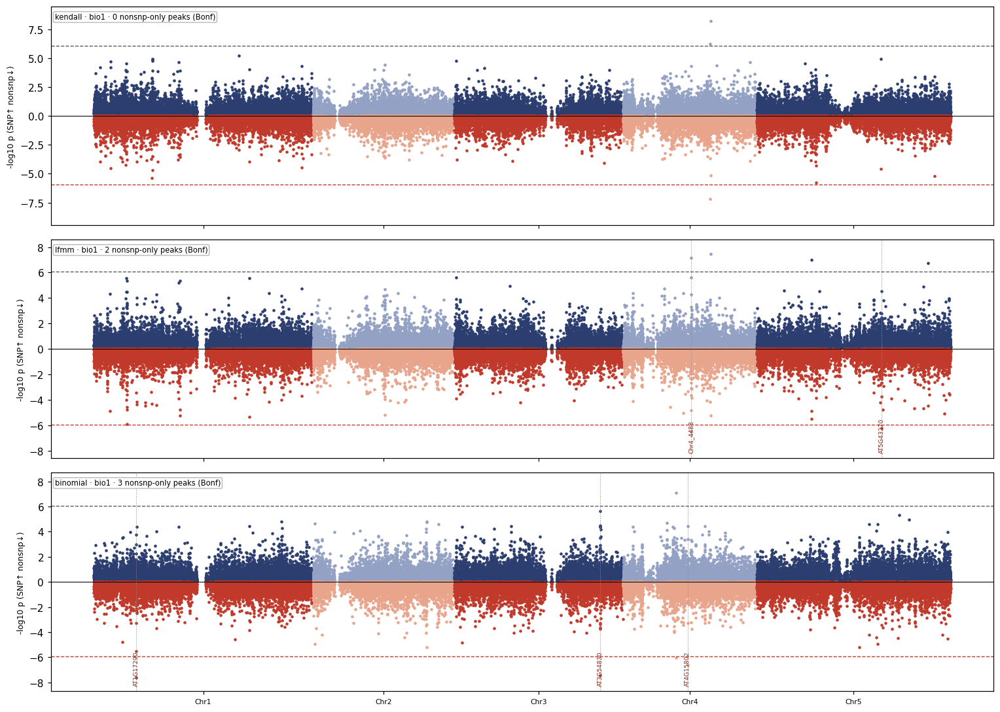

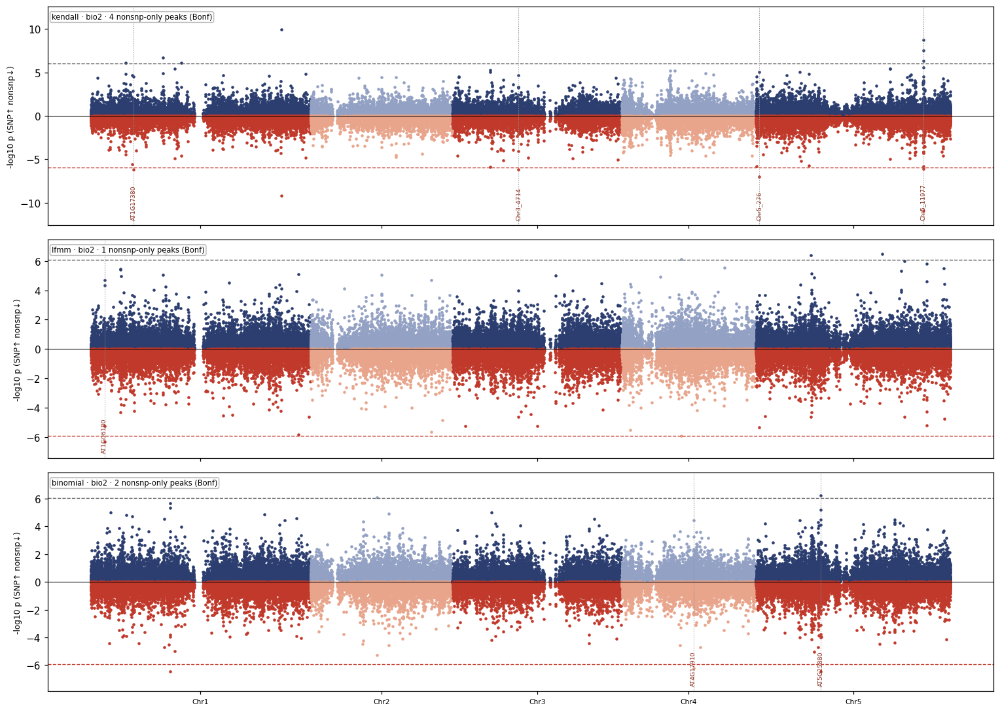

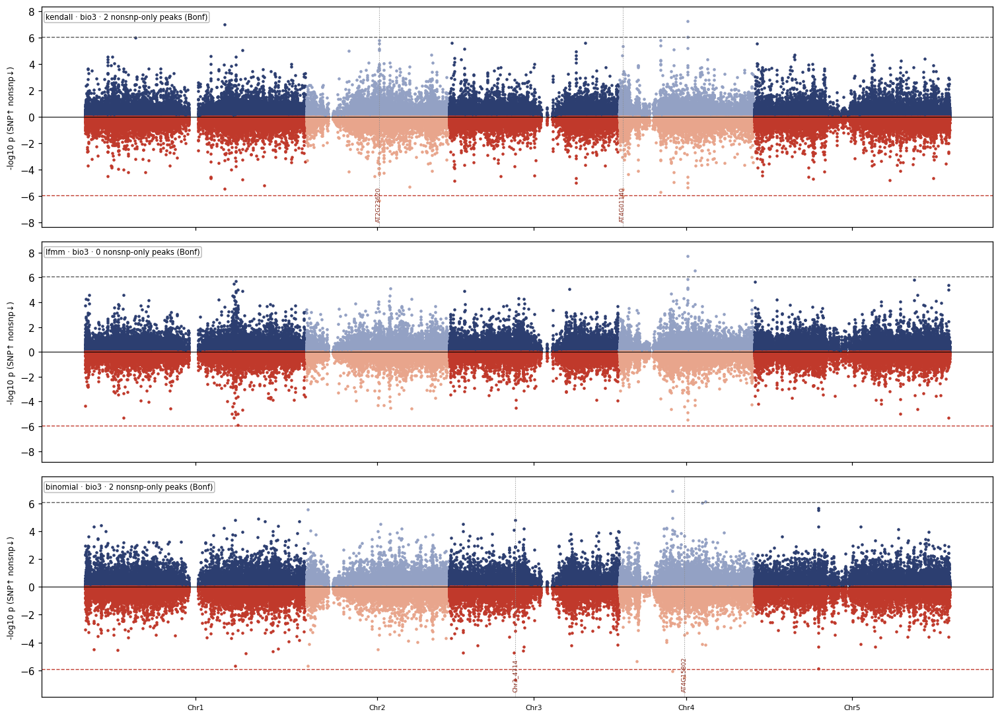

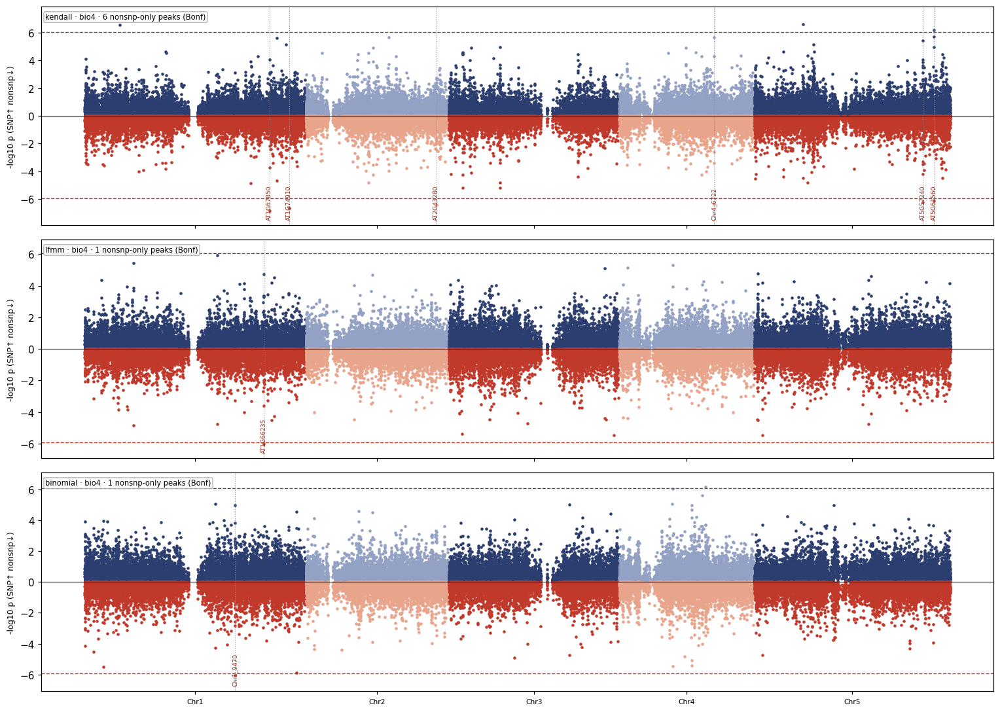

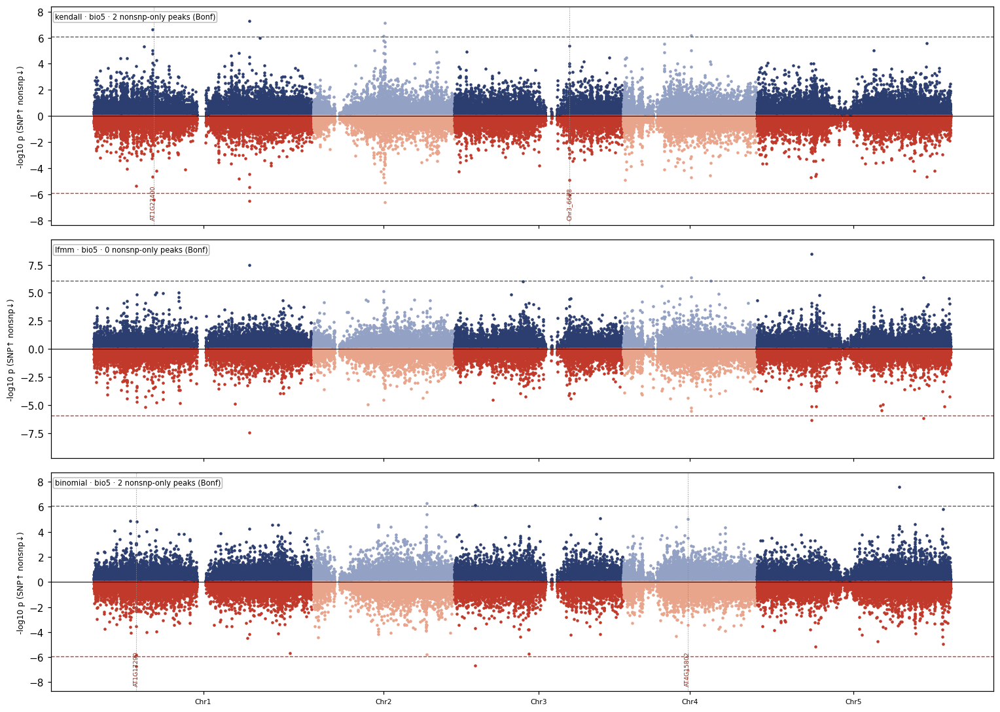

...

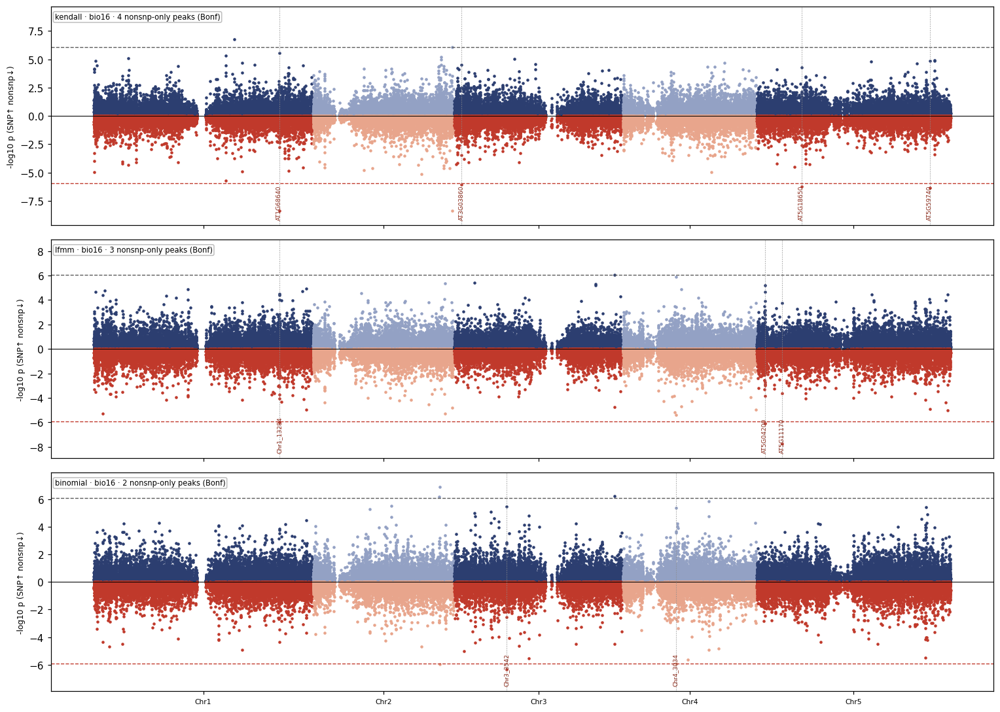

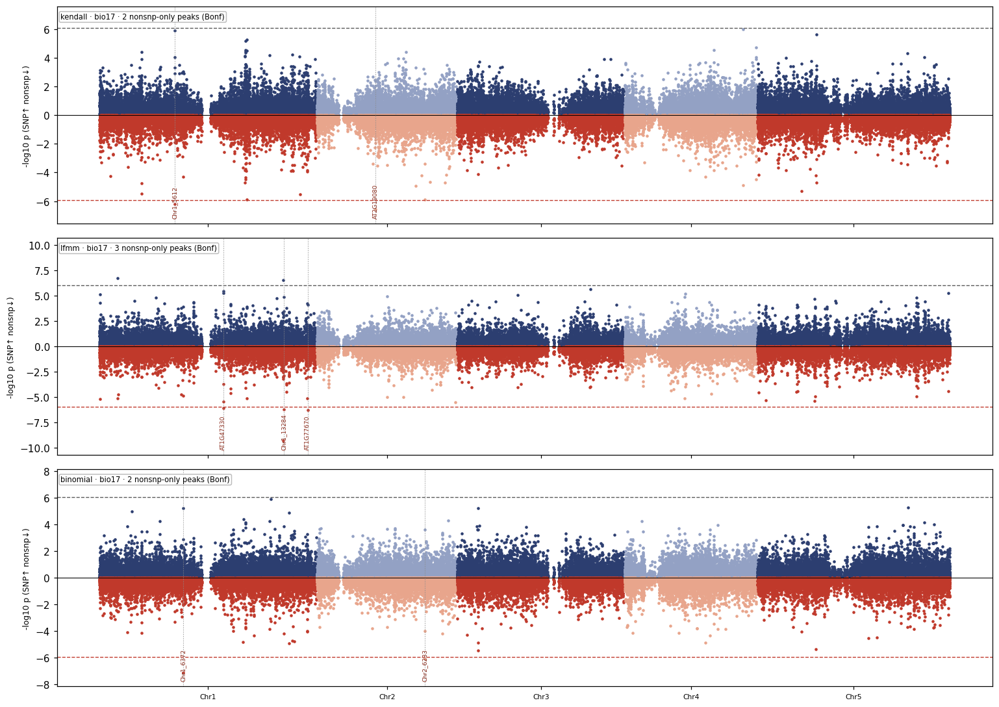

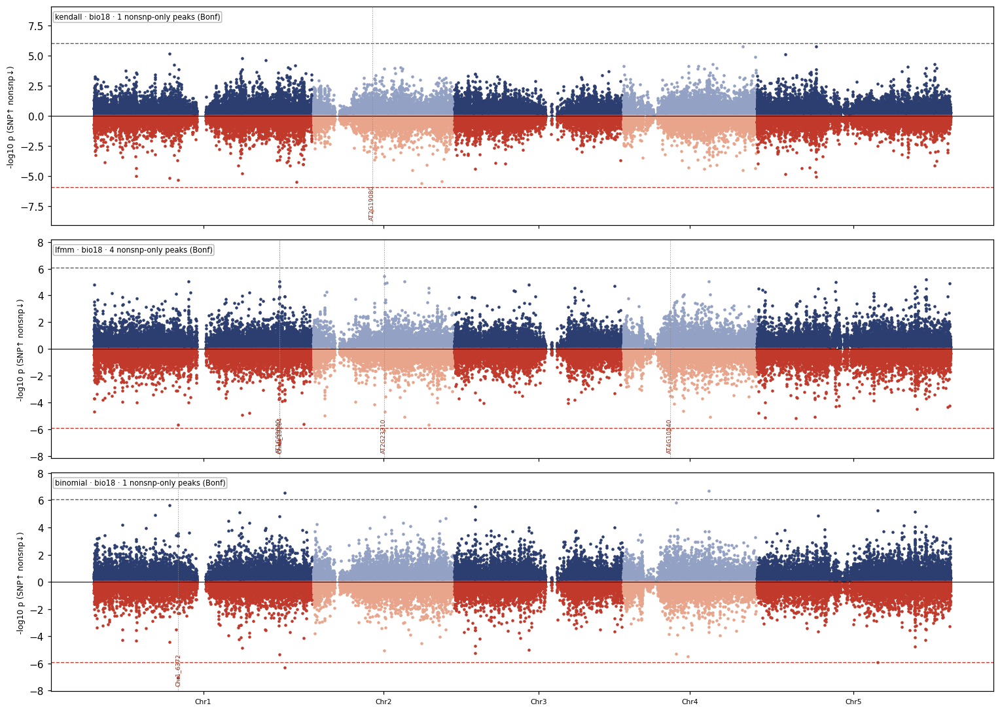

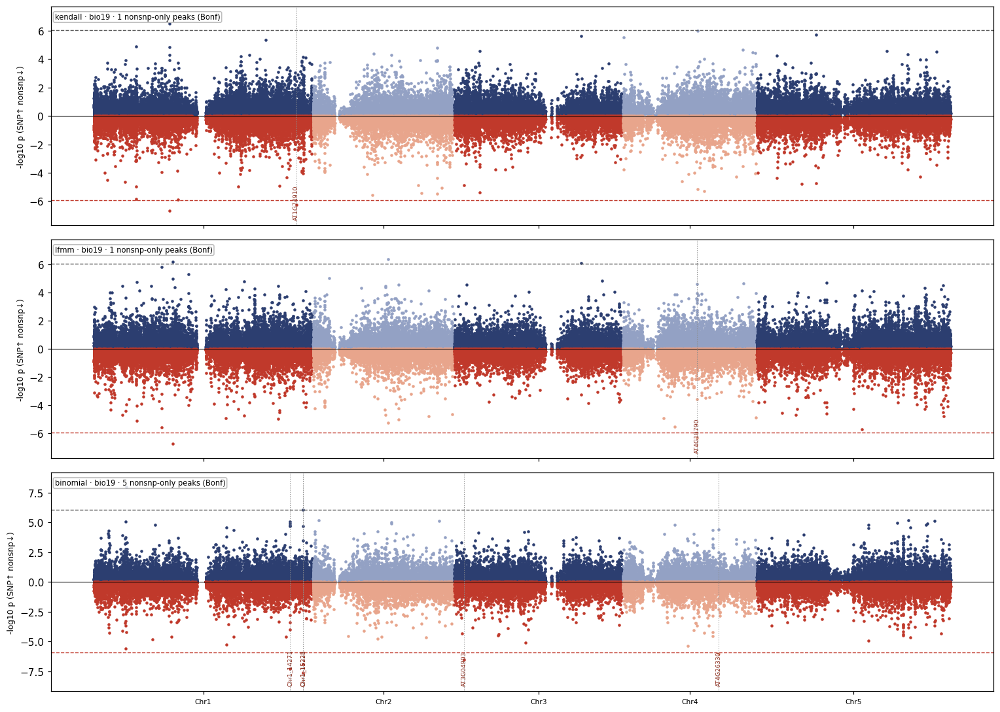

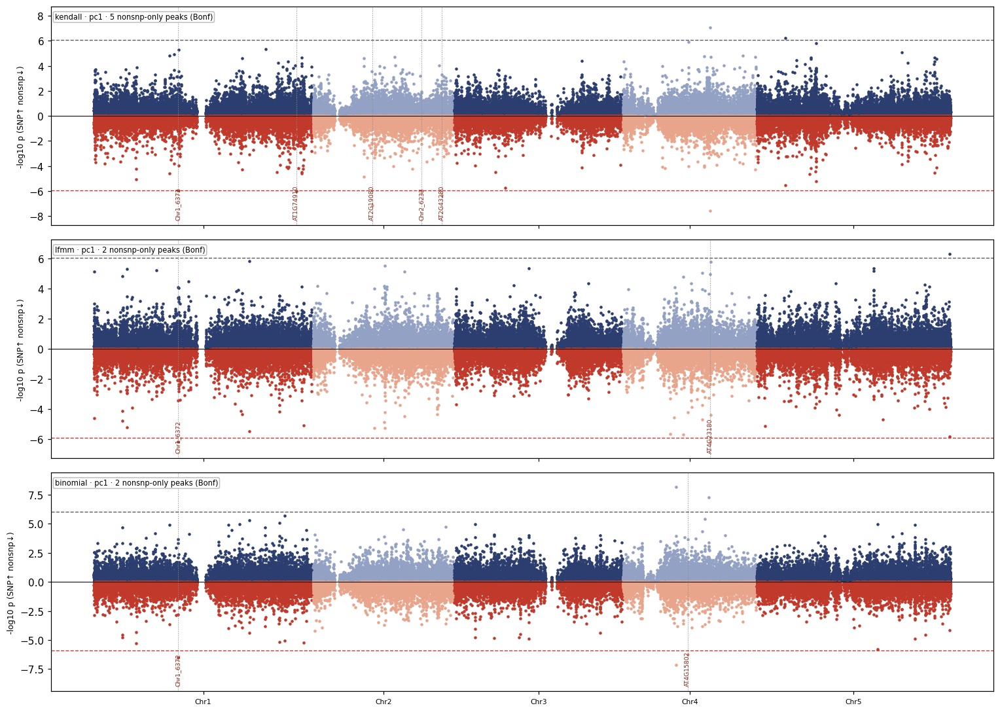

In [3]:
def mirror_panel(ax, axis, model, cls):
    ws=load_wza(model,"snp",axis); wn=load_wza(model,cls,axis)
    if ws is None or wn is None:
        ax.text(0.5,0.5,f"missing {axis} {model}",ha="center"); return []
    ss=sig_sets(ws); ns=sig_sets(wn); only=sorted(ns["bonf"]-ss["bonf"])
    for i,c in enumerate(CH):
        s=ws[ws.chrom==c]; v=wn[wn.chrom==c]
        ax.scatter(s.gpos, s.mlp,  s=4, c=("#2c3e70" if i%2==0 else "#93a1c4"), rasterized=True)
        ax.scatter(v.gpos, -v.mlp, s=4, c=("#c0392b" if i%2==0 else "#e8a58c"), rasterized=True)
    ax.axhline(0,c="k",lw=.7)
    ax.axhline( ss["bonf_line"], ls="--", c="0.35", lw=.9)
    ax.axhline(-ns["bonf_line"], ls="--", c="#c0392b", lw=.9)
    ymax=max(ws.mlp.max(), wn.mlp.max())*1.15
    for b in only:
        r=wn[wn.block==b].iloc[0]; gs=genes_on(b); lab=gs[0] if gs else b
        ax.axvline(r.gpos, ls=":", c="0.55", lw=.7)
        ax.annotate(lab, xy=(r.gpos,-ymax*0.95), ha="center", va="bottom", fontsize=6,
                    color="#8a2a1a", rotation=90)
    ax.set_ylim(-ymax,ymax)
    ax.set_xticks([OFF[c]+CHROM_LEN[c]/2 for c in CH]); ax.set_xticklabels(CH, fontsize=7)
    ax.set_ylabel(f"-log10 p (SNP↑ {cls}↓)", fontsize=8)
    ax.annotate(f"{model} · {axis} · {len(only)} {cls}-only peaks (Bonf)",
                xy=(0.004,0.97), xycoords="axes fraction", va="top", fontsize=7.5,
                bbox=dict(boxstyle="round,pad=0.2",fc="white",ec="0.7",alpha=.85))
    return only

def axis_figure(axis, cls):
    fig,axes=plt.subplots(3,1,figsize=(14,10),sharex=True)
    for a,m in zip(axes,MODELS): mirror_panel(a, axis, m, cls)
    fig.tight_layout(); plt.show()

NONSNP_CLASS = "nonsnp"   # pooled non-SNP; primary "what's new on non-SNP"
for axis in AXES:
    axis_figure(axis, NONSNP_CLASS)

## C. SV-specific peaks × climate axes — dot grid (all 3 models)

Rows = SV-specific peak blocks (WZA Bonf-sig in SV, SNP not, in ≥1 axis×model),
gene-labelled. Columns = the 20 climate axes. **Dot size ∝ SV −log10p** at that
(peak, axis); **dot colour = SNP −log10p at the same block** (pale = SNPs weak there
= the "new" story; dark = strong in SNP too = likely tagging). **Black ring = peak is
SV-specific at that axis** (SV Bonf-sig & SNP not). One panel per model.

12 SV-specific (Bonf) peak blocks across the 20 axes


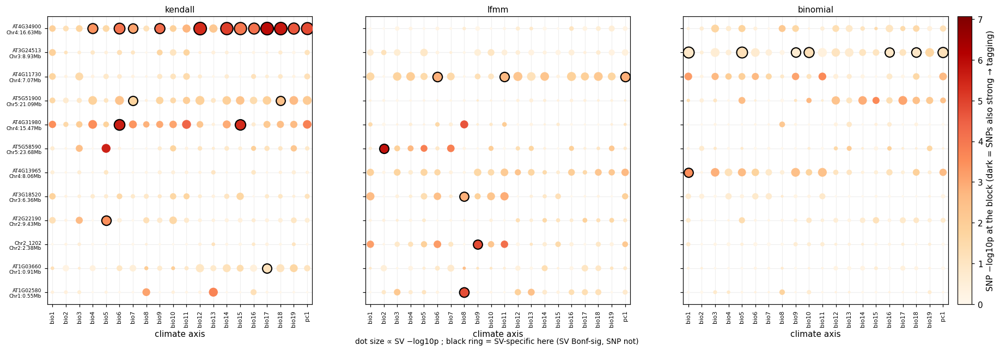

In [4]:
# gather SV-specific peaks (Bonf) and a (peak x axis x model) grid of SV/SNP -log10p
grid = {}   # (block, axis, model) -> (sv_mlp, snp_mlp, sv_bonf, snp_bonf)
recur = {}
for axis in AXES:
    for model in MODELS:
        ws=load_wza(model,"snp",axis); wv=load_wza(model,"sv",axis)
        if ws is None or wv is None: continue
        ss=sig_sets(ws); vs=sig_sets(wv)
        wsi=ws.set_index("block"); wvi=wv.set_index("block")
        for b in wv["block"]:
            sv_mlp=float(wvi.loc[b,"mlp"])
            snp_mlp=float(wsi.loc[b,"mlp"]) if b in wsi.index else np.nan
            sb=b in vs["bonf"]; nb_=b in ss["bonf"]
            grid[(b,axis,model)]=(sv_mlp,snp_mlp,sb,nb_)
            if sb and not nb_: recur[b]=recur.get(b,0)+1
peaks=sorted(recur, key=lambda b:(recur[b], b))   # least→most recurrent (most on top)
def rlabel(b):
    gs=genes_on(b); s=SPANS.loc[b] if b in SPANS.index else None
    pos=f"{s.chrom}:{s.start/1e6:.2f}Mb" if s is not None else b
    return f"{gs[0] if gs else b}\n{pos}"
labels=[rlabel(b) for b in peaks]
print(f"{len(peaks)} SV-specific (Bonf) peak blocks across the 20 axes")

import matplotlib as mpl
snp_bonf_ref = -np.log10(0.05/57603)   # ~SNP Bonferroni line, for the colour reference
fig,axs=plt.subplots(1,3,figsize=(20,1.2+0.42*len(peaks)),sharey=True)
norm=mpl.colors.Normalize(vmin=0, vmax=max(6.5, snp_bonf_ref+1))
cmap=plt.cm.OrRd
for k,model in enumerate(MODELS):
    a=axs[k]
    for xi,axis in enumerate(AXES):
        for yi,b in enumerate(peaks):
            g=grid.get((b,axis,model))
            if g is None: continue
            sv_mlp,snp_mlp,sb,nb_=g
            size=8+22*min(sv_mlp,10)
            ec = "black" if (sb and not nb_) else "none"
            lw = 1.4 if (sb and not nb_) else 0
            a.scatter(xi,yi,s=size,c=[cmap(norm(np.nan_to_num(snp_mlp)))],
                      edgecolors=ec,linewidths=lw,zorder=3)
    a.set_xticks(range(len(AXES))); a.set_xticklabels(AXES,rotation=90,fontsize=7)
    a.set_yticks(range(len(peaks)))
    if k==0: a.set_yticklabels(labels,fontsize=6)
    a.set_xlabel("climate axis"); a.set_ylim(-0.5,len(peaks)-0.5); a.margins(x=0.02)
    a.annotate(f"{model}",xy=(0.5,1.01),xycoords="axes fraction",ha="center",va="bottom",fontsize=10)
    a.grid(True,alpha=0.2,zorder=0)
cb=fig.colorbar(mpl.cm.ScalarMappable(norm=norm,cmap=cmap),ax=axs,fraction=0.02,pad=0.01)
cb.set_label("SNP −log10p at the block (dark = SNPs also strong → tagging)")
fig.text(0.5,0.005,"dot size ∝ SV −log10p ; black ring = SV-specific here (SV Bonf-sig, SNP not)",
         ha="center",fontsize=9)
plt.show()

## D. Full SV decomposition — SNP↑ / SV↓ mirror Manhattans, 3 models per axis

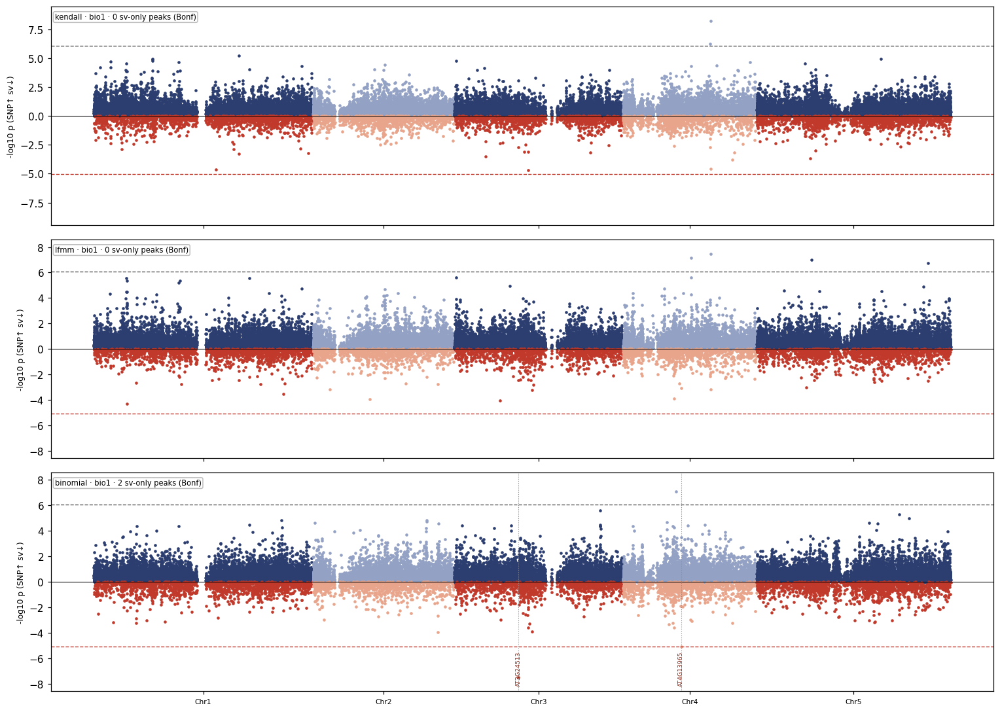

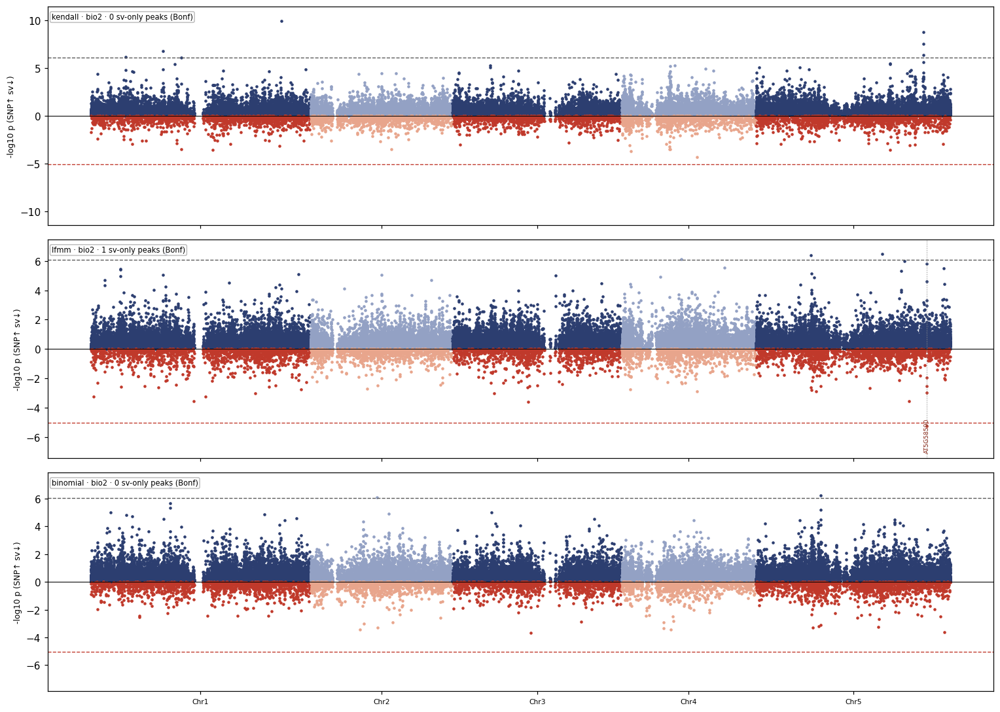

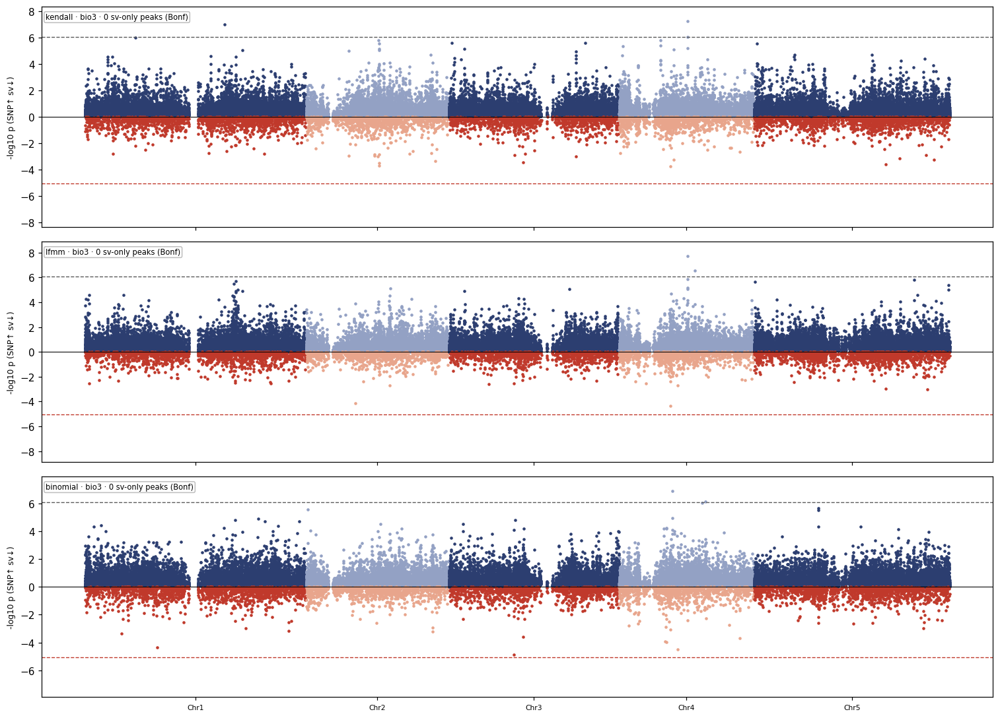

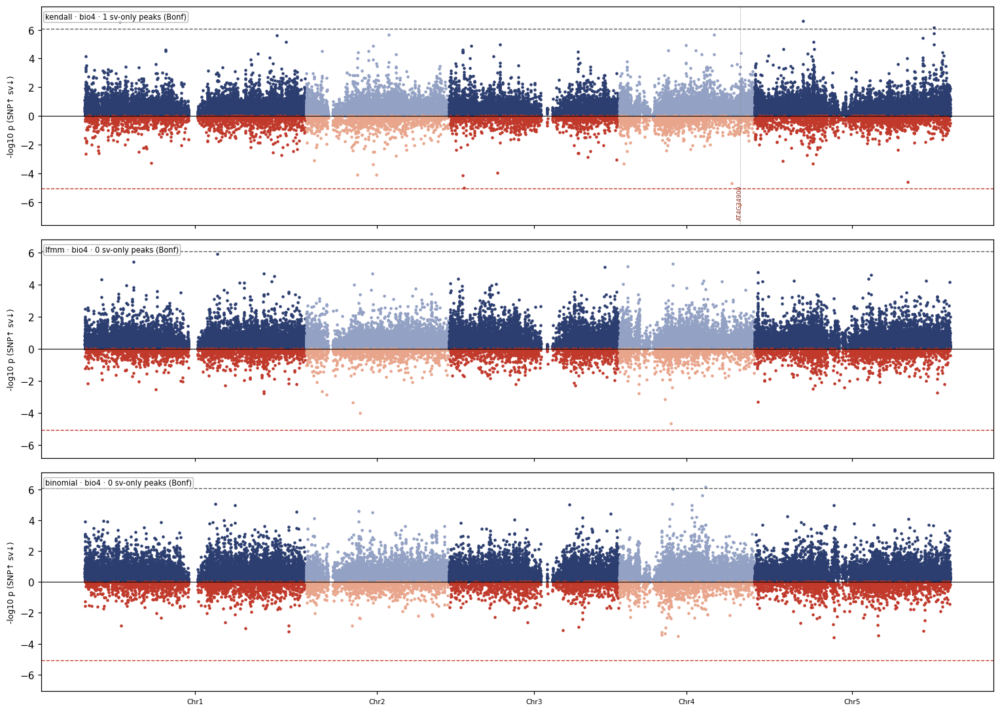

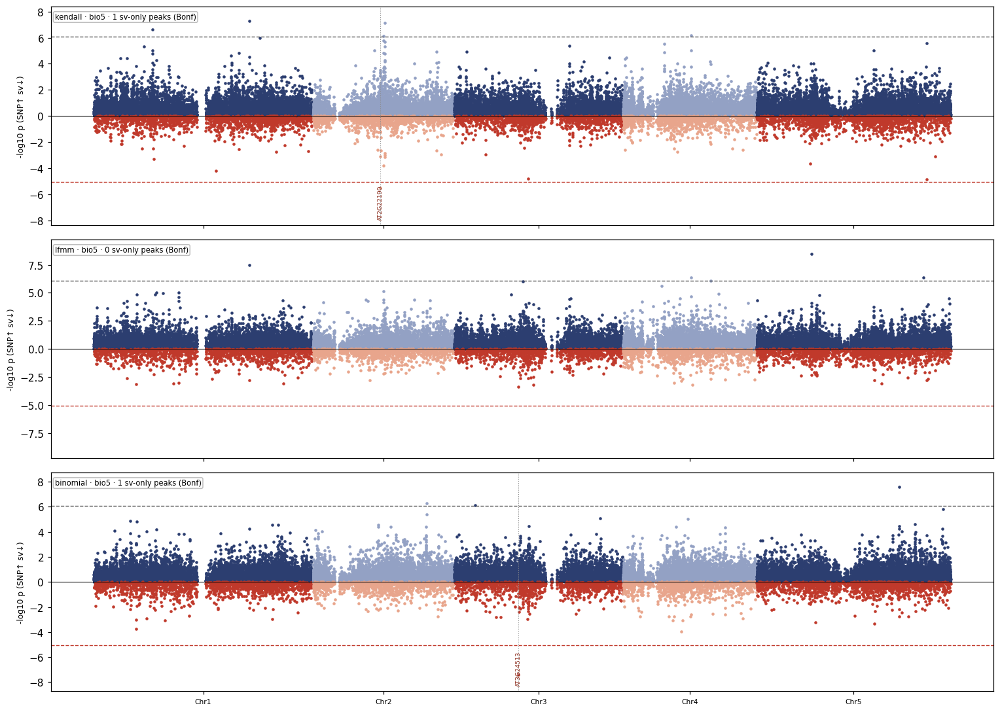

...

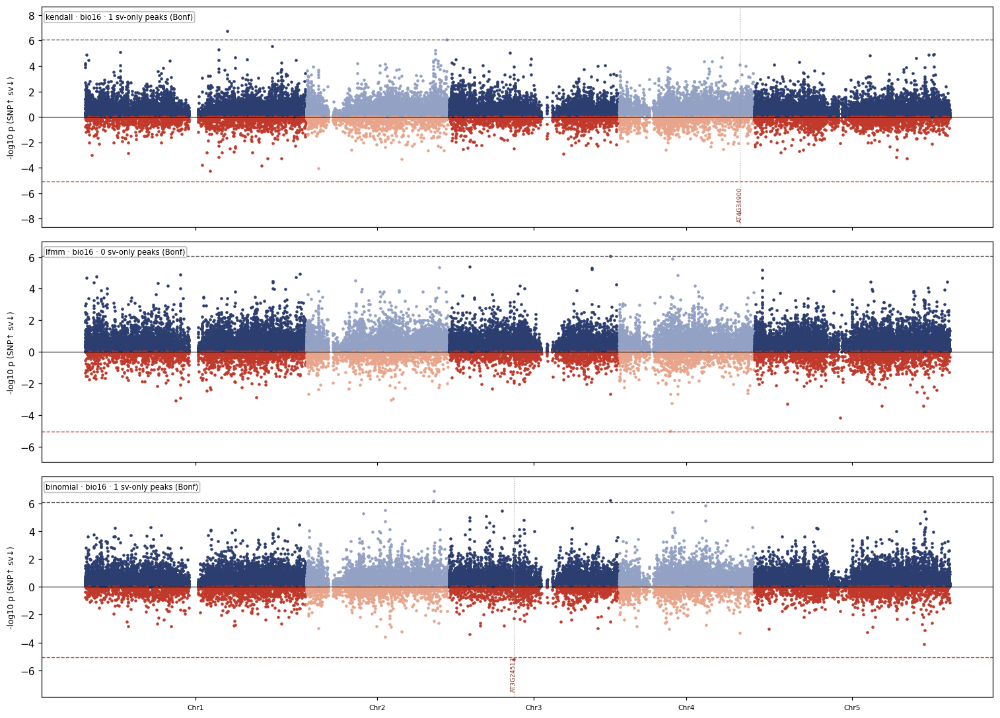

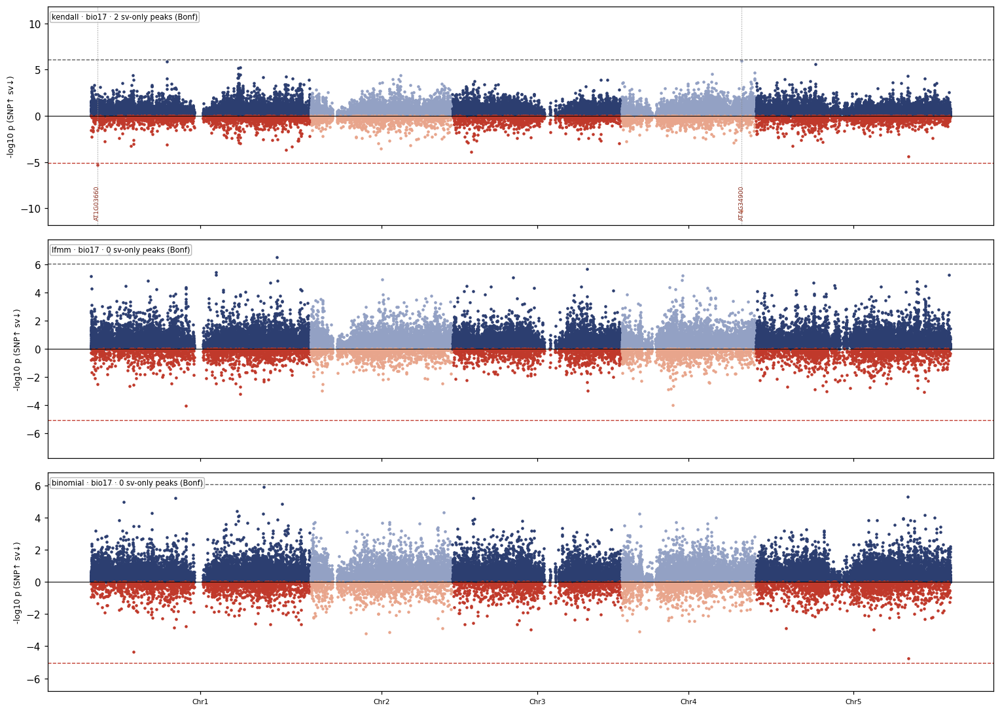

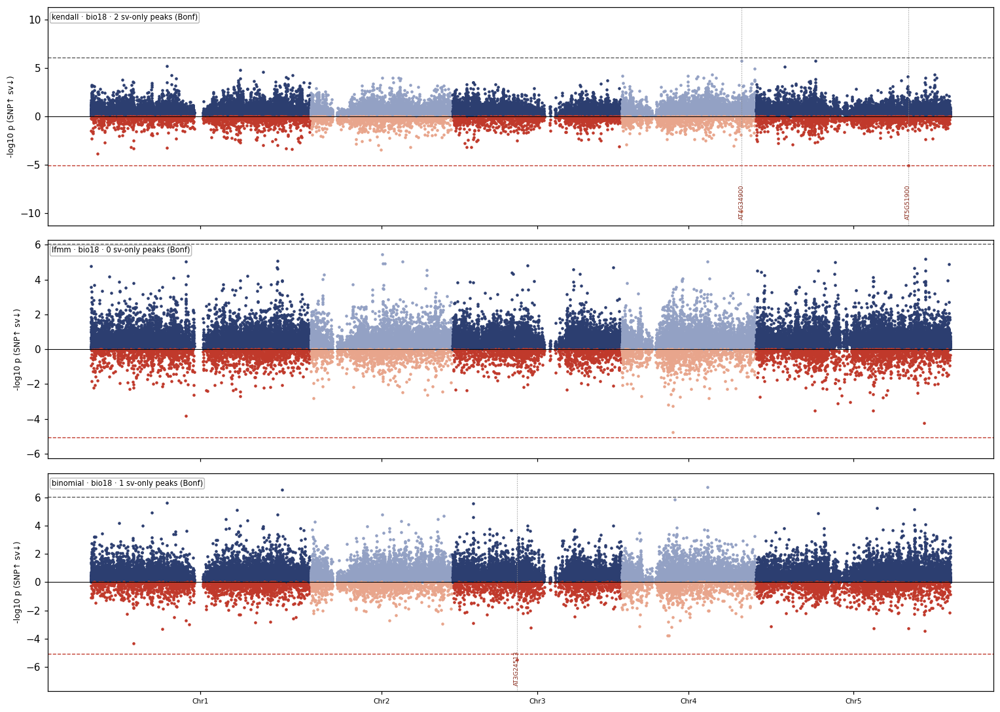

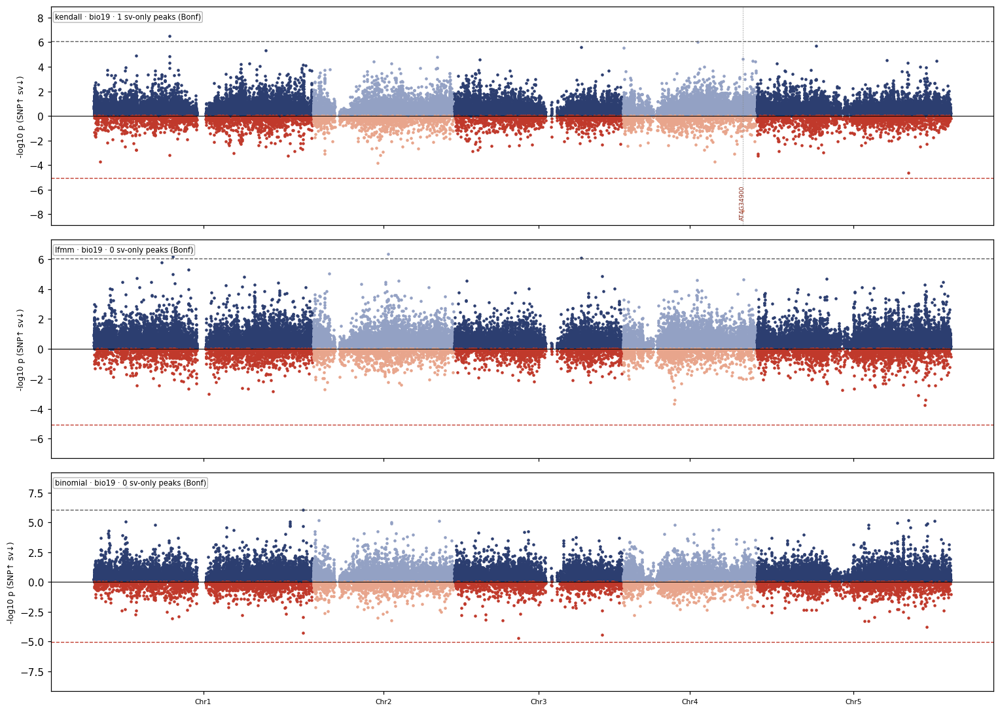

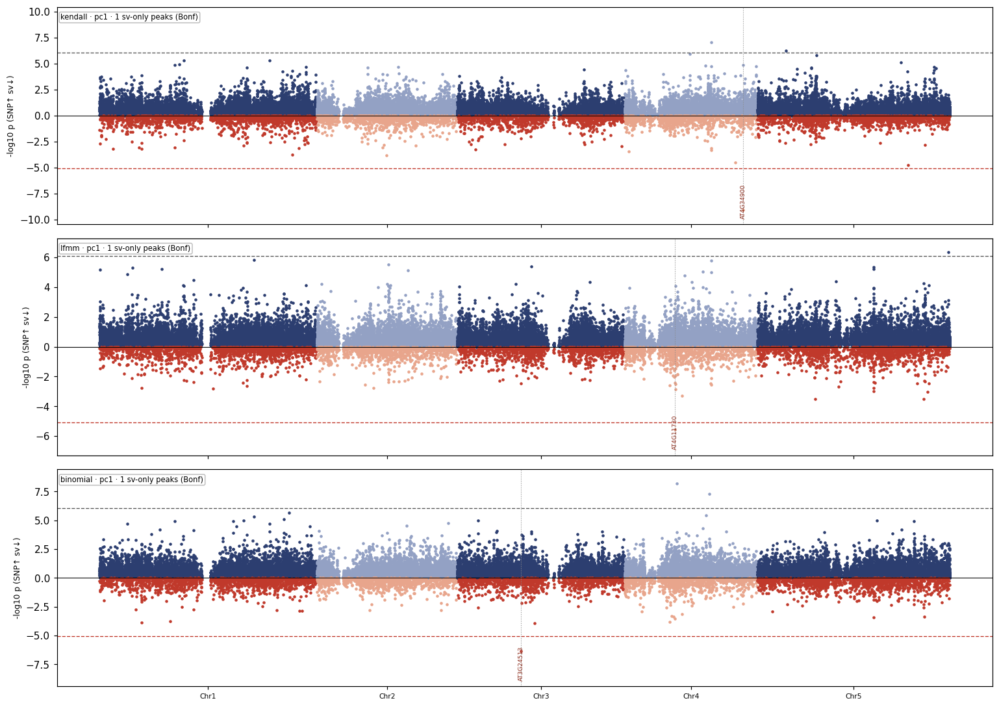

In [5]:
for axis in AXES:
    axis_figure(axis, "sv")